In [52]:
import numpy as np 
import pandas as pd 

import matplotlib.pyplot as plt 
import seaborn as sns 
import plotly
import plotly.express as px 

%matplotlib inline
plt.style.use('seaborn-v0_8')

import spacy
import pycountry

nlp_en = spacy.load("en_core_web_sm")
nlp_ru = spacy.load("ru_core_news_sm")

import re
import html

from langdetect import detect

In [53]:
pd.options.mode.chained_assignment = None  

In [54]:
leads = pd.read_csv('Leads.csv')
leads.head(2)

,LEAD_STATUS,LEAD_SOURCE,SALES_NAME,DEAL_STATUS,LEAD_ID,COMMENTS,DESCRIPTION,LEAD_CREATION_DATE,LEAD_CLOSURE_DATE,LOST_REASON
0,Lost,Web-Site,Tatiana,LOST,244266,Lead generated from page &quot;Home&quot;\nUse...,good afternoon please let me know if you are d...,11/4/2024 8:09,11/8/2024 8:10,Still Deciding
1,Lost,Web-Site,User,LOST,243277,Lead generated from Landing page &quot;Home&qu...,i need a visa am a tile fixer,10/31/2024 2:39,10/31/2024 2:42,Work Permit


In [55]:
leads.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27514 entries, 0 to 27513
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   LEAD_STATUS         27514 non-null  object
 1   LEAD_SOURCE         27514 non-null  object
 2   SALES_NAME          27514 non-null  object
 3   DEAL_STATUS         27514 non-null  object
 4   LEAD_ID             27514 non-null  int64 
 5   COMMENTS            9510 non-null   object
 6   DESCRIPTION         9407 non-null   object
 7   LEAD_CREATION_DATE  27514 non-null  object
 8   LEAD_CLOSURE_DATE   27199 non-null  object
 9   LOST_REASON         22237 non-null  object
dtypes: int64(1), object(9)
memory usage: 2.1+ MB


<h1 style="text-align: center;">Cleaning the dataset and extracting useful data</h1>


### 1. Removing complete duplicates 

### 2. Extracting useful info from the COMMENTS feature:

a) Extracting lanfing page/where lead was generated from into GENERATED_FROM.  
b) Extracting user comment into USER_COMMENT   
c) Deleting DESCRIPTION feature, since it replicates USER_COMMENT, but lacks special characters and sometimes lacks the beginning of the comment.  
d) Extracting EXTRA_COMMENT from COMMENTS — for extra info that does not match GENERATED_FROM or USER_COMMENT formatting —— usually contains destination country.  
e) Extracting PHONE_NUMBER and EMAL, removing random and passport numbers from USER_COMMENT.  
f) Extracting VISA_TYPE from USER_COMMENT — only when it's clear that the customer is looking for a specific visa type. 
g) Extracting a no reply text into NO_REPLY_TEXT where available. 

### 3. Extracting useful date info: 
a) Converting LEAD_CREATION_DATE and LEAD_CLOSURE_DATE into separate DATE and HOUR columns.  
b) Extracting WEEKDAY and MONTH from LEAD_CREATION_DATE.  
c) Calculating CLOSURE_TIME_DAYS to see how many days it usually takes to close a deal.   
d) Grouping closure timr days into CLOSURE_DAY_GROUP to analyze more efficiantly.   
e) Extracting NO_REPLY_DATE from NO_REPLY_TEXT and calculating DAYS_FROM_NO_REPLY_TO_CLOSURE to see how long it takes to consider the lead closed after the no reply.

### 4. Creating features for sales managers' effectiveness:
a) Creating a measure for the sales managers' conversion rates.
b) Creating an EFFECTIVENESS_SCORE feature — a new KPI based on the managers' conversion rates as well as their overall absolute succesful deals.
c) Grouping managers into top, middle, and low performing based on their effectiveness score. 


In [56]:
# Removing duplicates
num_duplicates = leads.duplicated().sum()
print(f"Number of complete duplicate rows: {num_duplicates}")


leads_cleaned = leads.drop_duplicates()
print(f"New shape of dataset: {leads_cleaned.shape}")

Number of complete duplicate rows: 565
New shape of dataset: (26949, 10)


In [57]:
num_id_duplicates = leads_cleaned['LEAD_ID'].duplicated().sum()
print(f"Number of complete duplicate rows: {num_id_duplicates}")

Number of complete duplicate rows: 0


In [58]:
# === Extracting GENERATED_FROM, USER_COMMENT, and NO_REPLY_TEXT from the COMMENTS field ===

def extract_structured_fields(text):
    if not isinstance(text, str):
        return "", "", ""

    # Unescaping HTML characters and cleaning whitespace
    text = html.unescape(text)
    text = text.replace("\\n", "\n")
    text = re.sub(r'\s+', ' ', text).strip()

    generated_from = ""
    user_comment = ""
    no_reply_text = ""

    generated_from_map = {
        "Home Page": "Home",
        "Landing Page": "Home",
        "Homepage": "Home"
    }

    # Extracting GENERATED_FROM using known patterns
    match_gen = re.search(
        r'generated from (.*?)(?:\n|user.?s comment|users comment|user comment|comment|$)',
        text, flags=re.IGNORECASE
    )
    if match_gen:
        raw_generated_from = match_gen.group(1).strip()
        quoted = re.search(r'"([^"]+)"', raw_generated_from)
        if quoted:
            generated_from = quoted.group(1).strip().title()
        else:
            generated_from = raw_generated_from.strip().title()
        generated_from = generated_from_map.get(generated_from, generated_from)

    # Extracting USER_COMMENT using standard comment label patterns
    comment_patterns = ["user's comment", "users comment", "user comment", "comment"]
    for pattern in comment_patterns:
        match = re.search(pattern, text, flags=re.IGNORECASE)
        if match:
            user_comment = text[match.end():].strip()
            break

    # Extracting USER_COMMENT from fallback pattern like "Destination Country" if no user comment found
    if not user_comment:
        fallback_match = re.search(
            r'(destination country|destination|country)[^\w]*:?[^\w]*(.*?)(?:\n|;|$)',
            text, flags=re.IGNORECASE
        )
        if fallback_match:
            user_comment = fallback_match.group(2).strip()

    # Cleaning any leading punctuation or whitespace from USER_COMMENT
    user_comment = re.sub(r'^[:\-\s]+', '', user_comment).strip()

    # Extracting full text into NO_REPLY_TEXT if "no reply" is mentioned
    if "no reply" in text.lower():
        no_reply_text = text.strip()

    return generated_from, user_comment, no_reply_text

# Applying structured field extraction
extracted = leads_cleaned['COMMENTS'].apply(extract_structured_fields)
leads_cleaned['GENERATED_FROM'] = extracted.apply(lambda x: x[0])
leads_cleaned['USER_COMMENT'] = extracted.apply(lambda x: x[1])
leads_cleaned['NO_REPLY_TEXT'] = extracted.apply(lambda x: x[2])

# === Dropping DESCRIPTION field (contains duplicate or degraded comment info) ===
if 'DESCRIPTION' in leads_cleaned.columns:
    leads_cleaned.drop(columns=['DESCRIPTION'], inplace=True)

# === Extracting PHONE_NUMBER and USER_EMAIL from USER_COMMENT ===

# Defining regex patterns
phone_pattern = re.compile(r'(?<!\d)(\+?\d{7,15}|00\d{7,15}|0\d{7,15})(?!\d)')
email_pattern = re.compile(r'[\w\.-]+@[\w\.-]+\.\w+')
misspelled_email_pattern = re.compile(r'\b[\w\.-]+@[\w-]+com\b', flags=re.IGNORECASE)

# Detecting obviously fake numbers
def is_fake_number(number):
    if not isinstance(number, str):
        return True
    digits = re.sub(r'\D', '', number)
    if len(digits) < 8 or len(digits) > 15:
        return True
    if any(digits.count(d) > 5 for d in set(digits)):
        return True
    common_bad_substrings = ['1234', '4321', '123123', '1111', '0000']
    return any(pattern in digits for pattern in common_bad_substrings)

# Extracting valid phone number (skipping known fake patterns)
def extract_phone_number(text):
    if not isinstance(text, str):
        return None
    text_no_email = email_pattern.sub('', text)
    match = phone_pattern.search(text_no_email)
    if match:
        number = match.group(0)
        if not is_fake_number(number):
            return number
    return None

# Extracting and fixing potentially malformed email addresses
def extract_email(text):
    if not isinstance(text, str):
        return None
    match = misspelled_email_pattern.search(text)
    if match:
        return re.sub(r'@([\w-]+)com\b', r'@\1.com', match.group(0))
    match = email_pattern.search(text)
    return match.group(0) if match else None

# Applying PHONE_NUMBER and USER_EMAIL extraction
leads_cleaned['PHONE_NUMBER'] = leads_cleaned['USER_COMMENT'].apply(extract_phone_number)
leads_cleaned['USER_EMAIL'] = leads_cleaned['USER_COMMENT'].apply(extract_email)

# === Cleaning USER_COMMENT by removing phone/email and filtering out empty/noise text ===

def clean_user_comment(comment, phone, email):
    if not isinstance(comment, str):
        return None
    comment_stripped = comment.strip()
    if comment_stripped in {phone, email}:
        return None
    if phone:
        comment_stripped = comment_stripped.replace(phone, '').strip()
    if email:
        comment_stripped = comment_stripped.replace(email, '').strip()
    if not comment_stripped or re.fullmatch(r'[:\s\-\.\+@0-9]+', comment_stripped):
        return None
    return comment_stripped

leads_cleaned['USER_COMMENT'] = leads_cleaned.apply(
    lambda row: clean_user_comment(row['USER_COMMENT'], row['PHONE_NUMBER'], row['USER_EMAIL']),
    axis=1
)

# === Extracting EXTRA_COMMENT if USER_COMMENT and other structured fields are missing ===

def is_just_numbers(text):
    if not isinstance(text, str):
        return False
    return bool(re.fullmatch(r'\d+', text.strip()))

leads_cleaned['EXTRA_COMMENT'] = leads_cleaned.apply(
    lambda row: row['COMMENTS'] if (
        pd.isna(row['USER_COMMENT']) and
        (pd.isna(row['NO_REPLY_TEXT']) or str(row['NO_REPLY_TEXT']).strip() == '') and
        (pd.isna(row['GENERATED_FROM']) or str(row['GENERATED_FROM']).strip() == '') and
        pd.notna(row['COMMENTS']) and
        not is_just_numbers(str(row['COMMENTS']))
    ) else None,
    axis=1
)

# === Replacing blanks, harmonizing NA/None across the dataset ===
leads_cleaned.replace(r'^\s*$', pd.NA, regex=True, inplace=True)
leads_cleaned = leads_cleaned.astype('object')
leads_cleaned = leads_cleaned.where(pd.notnull(leads_cleaned), None)

# === Detecting VISA_TYPE from USER_COMMENT and EXTRA_COMMENT (only if clearly indicated) ===

visa_type_patterns = {
    'Tourist': r'\b(travel\w*|touris\w*|visit\w*|vacation\w*|отдых\w*|турист\w*|путешеств\w*|voyag\w*|visite\w*|urlaub\w*|reisen\w*)\b',
    'Work': r'\b(job\w*|work\w*|employ\w*|profession\w*|business\w*|работ\w*|професс\w*|делов\w*|emploi\w*|travail\w*|beruf\w*|arbeit\w*)\b',
    'Student': r'\b(study\w*|universit\w*|course\w*|program\w*|student\w*|educat\w*|academic\w*|учеб\w*|студент\w*|университет\w*|cours\w*|étud\w*|schule\w*|studier\w*)\b',
    'Medical': r'\b(medic\w*|hospital\w*|treat\w*|surger\w*|clinic\w*|здоров\w*|медиц\w*|лечен\w*|hôpital\w*|clinique\w*|behandl\w*|gesund\w*)\b',
    'Transit': r'\b(transit\w*|пересадк\w*|транзит\w*|escale\w*|anschluss\w*)\b'
}

def detect_visa_type(row):
    text = f"{row.get('USER_COMMENT', '') or ''} {row.get('EXTRA_COMMENT', '') or ''}".lower()
    for visa_type, pattern in visa_type_patterns.items():
        if re.search(pattern, text, flags=re.IGNORECASE):
            return visa_type
    return None

# Applying visa type detection
leads_cleaned['VISA_TYPE'] = leads_cleaned.apply(detect_visa_type, axis=1)


In [59]:
# Converting all the nan and empty values to a single format
leads_cleaned.replace(r'^\s*$', np.nan, regex=True, inplace=True)

leads_cleaned = leads_cleaned.astype('object')  # making sure dtype is consistent
leads_cleaned = leads_cleaned.where(pd.notnull(leads_cleaned), np.nan)

/var/folders/67/x74mgr8122l6kp90mlcp_vv80000gn/T/ipykernel_2621/2144451288.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  leads_cleaned.replace(r'^\s*$', np.nan, regex=True, inplace=True)


In [60]:
leads_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 26949 entries, 0 to 27513
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   LEAD_STATUS         26949 non-null  object
 1   LEAD_SOURCE         26949 non-null  object
 2   SALES_NAME          26949 non-null  object
 3   DEAL_STATUS         26949 non-null  object
 4   LEAD_ID             26949 non-null  object
 5   COMMENTS            9388 non-null   object
 6   LEAD_CREATION_DATE  26949 non-null  object
 7   LEAD_CLOSURE_DATE   26642 non-null  object
 8   LOST_REASON         21924 non-null  object
 9   GENERATED_FROM      7880 non-null   object
 10  USER_COMMENT        8172 non-null   object
 11  NO_REPLY_TEXT       832 non-null    object
 12  PHONE_NUMBER        84 non-null     object
 13  USER_EMAIL          65 non-null     object
 14  EXTRA_COMMENT       206 non-null    object
 15  VISA_TYPE           3254 non-null   object
dtypes: object(16)
memory usage:

### Conducting some more preliminary analysis to identify what else could be cleaned.

In [61]:
leads_cleaned[leads_cleaned['EXTRA_COMMENT'].notna()]['EXTRA_COMMENT'].value_counts()

EXTRA_COMMENT
запуск бота                                                                                                 132
Company Formation                                                                                            49
Destination Country:                                                                                          3
schengen                                                                                                      2
Destination Country:                                                                                          2
Ждёт связи с ним                                                                                              1
 Schengen\n                                                                                                   1
Schengen\n                                                                                                    1
Destination Country:1                                                                     

In [62]:
leads_cleaned[leads_cleaned['USER_COMMENT'].notna()]['USER_COMMENT'].value_counts()

USER_COMMENT
Hi                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                         

In [63]:
leads_cleaned['LOST_REASON'].value_counts()

LOST_REASON
Work Permit       6091
Old Inquiry       5689
No response       3052
Not Eligible      1922
Duplicate Lead    1737
Still Deciding    1434
Too Expensive      655
Changed Mind       646
Competitor         279
No offer           249
Test lead          156
No trust            14
Name: count, dtype: int64

# Additional observations

1. It appeares that some of the rows represent company tests, so they can be removed.  

2. It can also be pointed out that "запуск бота" in the COMMENTS feature and "Company Formation" might refer to some user events recordrded in the CRM system. 

3. User input needs to be controlled; for examle: LEAD:ID 3705	with email entered incorrecrly as "Ramsisparsad 45@gmail.com" cannot be identified as having more than 10 duplicate inquaries with the email entered correctly as: "Ramsisparsad45@gmail.com"

4. After removing complete duplicates from the dataset, there are still 48 rows that contain duplicates (either on phone number or email adress). We are removing them too, keeping one occurance.

In [64]:
leads_cleaned = leads_cleaned[leads_cleaned['LOST_REASON'] != 'Test lead']

In [65]:
leads_cleaned['LOST_REASON'].value_counts()

LOST_REASON
Work Permit       6091
Old Inquiry       5689
No response       3052
Not Eligible      1922
Duplicate Lead    1737
Still Deciding    1434
Too Expensive      655
Changed Mind       646
Competitor         279
No offer           249
No trust            14
Name: count, dtype: int64

In [66]:
# Finding all rows where PHONE_NUMBER is duplicated ===
phone_dupes = leads_cleaned[leads_cleaned['PHONE_NUMBER'].notna()]
duplicate_phones = phone_dupes['PHONE_NUMBER'][phone_dupes['PHONE_NUMBER'].duplicated(keep=False)]
phone_matches = phone_dupes[phone_dupes['PHONE_NUMBER'].isin(duplicate_phones)]

# Finding all rows where USER_EMAIL is duplicated ===
email_dupes = leads_cleaned[leads_cleaned['USER_EMAIL'].notna()]
duplicate_emails = email_dupes['USER_EMAIL'][email_dupes['USER_EMAIL'].duplicated(keep=False)]
email_matches = email_dupes[email_dupes['USER_EMAIL'].isin(duplicate_emails)]

# Combining all duplicate matches into one dataset (no deduplication)
dupe_rows = pd.concat([phone_matches, email_matches]).drop_duplicates()

# Sorting for side-by-side visual inspection
dupe_rows_sorted = dupe_rows.sort_values(by=['PHONE_NUMBER', 'USER_EMAIL', 'USER_COMMENT'])

# Previewing
dupe_rows_sorted[['LEAD_ID', 'PHONE_NUMBER', 'USER_EMAIL', 'USER_COMMENT', 'COMMENTS', 'DEAL_STATUS', 'LOST_REASON']].head(5)


,LEAD_ID,PHONE_NUMBER,USER_EMAIL,USER_COMMENT,COMMENTS,DEAL_STATUS,LOST_REASON
19310,238933,0525028548,NaN,NaN,Lead generated from Landing page &quot;Home&qu...,LOST,Old Inquiry
27286,238932,0525028548,NaN,NaN,Lead generated from Landing page &quot;Home&qu...,LOST,Old Inquiry
12290,262737,0566658336,NaN,Job,Lead generated from Landing page &quot;Home&qu...,LOST,Work Permit
12662,262740,0566658336,NaN,Job,Lead generated from Landing page &quot;Home&qu...,LOST,Work Permit
19429,238733,404232442,afuhaapai7@gmail.com,Enquiring about a visitor visa . I have my wha...,Lead generated from Landing page &quot;Home&qu...,LOST,Old Inquiry


In [67]:
# Identifing duplicate PHONE_NUMBERs (excluding NaNs)
dup_phones = leads_cleaned['PHONE_NUMBER'].dropna()
phone_dupes = leads_cleaned[leads_cleaned['PHONE_NUMBER'].isin(dup_phones[dup_phones.duplicated(keep='first')])]

# Identifing duplicate USER_EMAILs (excluding NaNs)
dup_emails = leads_cleaned['USER_EMAIL'].dropna()
email_dupes = leads_cleaned[leads_cleaned['USER_EMAIL'].isin(dup_emails[dup_emails.duplicated(keep='first')])]

# Combining both sets of duplicates
rows_to_drop = pd.concat([phone_dupes, email_dupes]).drop_duplicates()

# Dropping them from the original DataFrame
leads_cleaned = leads_cleaned.drop(rows_to_drop.index).reset_index(drop=True)



In [68]:
leads_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26745 entries, 0 to 26744
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   LEAD_STATUS         26745 non-null  object
 1   LEAD_SOURCE         26745 non-null  object
 2   SALES_NAME          26745 non-null  object
 3   DEAL_STATUS         26745 non-null  object
 4   LEAD_ID             26745 non-null  object
 5   COMMENTS            9246 non-null   object
 6   LEAD_CREATION_DATE  26745 non-null  object
 7   LEAD_CLOSURE_DATE   26438 non-null  object
 8   LOST_REASON         21720 non-null  object
 9   GENERATED_FROM      7745 non-null   object
 10  USER_COMMENT        8070 non-null   object
 11  NO_REPLY_TEXT       832 non-null    object
 12  PHONE_NUMBER        55 non-null     object
 13  USER_EMAIL          42 non-null     object
 14  EXTRA_COMMENT       201 non-null    object
 15  VISA_TYPE           3235 non-null   object
dtypes: object(16)
memory u

### 2. Extracting useful time-related information

In [69]:
import pandas as pd
import re

# 1. Converting LEAD_CREATION_DATE and LEAD_CLOSURE_DATE to datetime format
leads_cleaned['LEAD_CREATION_DATETIME'] = pd.to_datetime(leads_cleaned['LEAD_CREATION_DATE'], errors='coerce')
leads_cleaned['LEAD_CLOSURE_DATETIME'] = pd.to_datetime(leads_cleaned['LEAD_CLOSURE_DATE'], errors='coerce')

# 2. Extracting date and hour components from the datetime columns
leads_cleaned['CREATION_DATE'] = leads_cleaned['LEAD_CREATION_DATETIME'].dt.date
leads_cleaned['CLOSURE_DATE'] = leads_cleaned['LEAD_CLOSURE_DATETIME'].dt.date

leads_cleaned['CREATION_HOUR'] = leads_cleaned['LEAD_CREATION_DATETIME'].dt.hour
leads_cleaned['CLOSURE_HOUR'] = leads_cleaned['LEAD_CLOSURE_DATETIME'].dt.hour

# 3. Extracting WEEKDAY and MONTH from the lead creation datetime
leads_cleaned['WEEKDAY'] = leads_cleaned['LEAD_CREATION_DATETIME'].dt.day_name()
leads_cleaned['MONTH'] = leads_cleaned['LEAD_CREATION_DATETIME'].dt.month

# 4. Calculating how many days it took to close the lead
leads_cleaned['CLOSURE_TIME_DAYS'] = (
    leads_cleaned['CLOSURE_DATE'] - leads_cleaned['CREATION_DATE']
).apply(lambda x: x.days if pd.notnull(x) else None)

# 5. Grouping closure times into categories for easier analysis
def categorize_days(day):
    if pd.isnull(day):
        return 'Unknown'
    elif day == 0:
        return 'Day 0'
    elif day == 1:
        return 'Day 1'
    elif day == 2:
        return 'Day 2'
    elif day == 3:
        return 'Day 3'
    elif 4 <= day <= 5:
        return 'Days 4-5'
    elif 6 <= day <= 9:
        return 'Days 6-9'
    elif day >= 10:
        return 'Days 10+'
    return 'Unknown'

leads_cleaned['CLOSURE_DAY_GROUP'] = leads_cleaned['CLOSURE_TIME_DAYS'].apply(categorize_days)

# 6. Extracting NO_REPLY_DATE from the NO_REPLY_TEXT field
def extract_no_reply_date(text):
    if not isinstance(text, str):
        return None
    match = re.search(r'no reply received - (\d{2}\.\d{2}\.\d{4})', text.lower())
    if match:
        try:
            return pd.to_datetime(match.group(1), format='%d.%m.%Y')
        except Exception:
            return None
    return None

leads_cleaned['NO_REPLY_DATE'] = leads_cleaned['NO_REPLY_TEXT'].apply(extract_no_reply_date)

# 7. Calculating number of days from no reply to lead closure
leads_cleaned['CLOSURE_DATE_DT'] = pd.to_datetime(leads_cleaned['CLOSURE_DATE'], errors='coerce')

leads_cleaned['DAYS_FROM_NO_REPLY_TO_CLOSURE'] = (
    leads_cleaned['CLOSURE_DATE_DT'] - leads_cleaned['NO_REPLY_DATE']
).apply(lambda x: x.days if pd.notnull(x) else None)

# Dropping the temporary datetime column used for the calculation
leads_cleaned.drop(columns=['CLOSURE_DATE_DT'], inplace=True)

# 8. Dropping original string-based datetime columns to reduce clutter
leads_cleaned.drop(columns=[
    'LEAD_CREATION_DATE', 'LEAD_CLOSURE_DATE',
    'LEAD_CREATION_DATETIME', 'LEAD_CLOSURE_DATETIME'
], inplace=True)


In [70]:
# Ensure datetime format
leads_cleaned['CREATION_DATE'] = pd.to_datetime(leads_cleaned['CREATION_DATE'])
leads_cleaned['CLOSURE_DATE'] = pd.to_datetime(leads_cleaned['CLOSURE_DATE'], errors='coerce')  # in case of NaT

# Helper function
def get_week_range(date, first_sunday):
    if pd.isna(date):
        return None
    if date <= first_sunday:
        return f"{start_date.date()} to {first_sunday.date()}"
    else:
        week_start = date - pd.Timedelta(days=date.weekday())
        week_end = week_start + pd.Timedelta(days=6)
        return f"{week_start.date()} to {week_end.date()}"

# Define starting week logic (based on creation date range)
start_date = leads_cleaned['CREATION_DATE'].min()
start_day = start_date.weekday()
first_sunday = start_date + pd.Timedelta(days=(6 - start_day))

# Apply to both columns
leads_cleaned['CREATION_WEEK_RANGE'] = leads_cleaned['CREATION_DATE'].apply(lambda d: get_week_range(d, first_sunday))
leads_cleaned['CLOSURE_WEEK_RANGE'] = leads_cleaned['CLOSURE_DATE'].apply(lambda d: get_week_range(d, first_sunday))

In [71]:
leads_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26745 entries, 0 to 26744
Data columns (total 26 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   LEAD_STATUS                    26745 non-null  object        
 1   LEAD_SOURCE                    26745 non-null  object        
 2   SALES_NAME                     26745 non-null  object        
 3   DEAL_STATUS                    26745 non-null  object        
 4   LEAD_ID                        26745 non-null  object        
 5   COMMENTS                       9246 non-null   object        
 6   LOST_REASON                    21720 non-null  object        
 7   GENERATED_FROM                 7745 non-null   object        
 8   USER_COMMENT                   8070 non-null   object        
 9   NO_REPLY_TEXT                  832 non-null    object        
 10  PHONE_NUMBER                   55 non-null     object        
 11  USER_EMAIL     

### 4. Creating features for sales managers' effectiveness

In [72]:
# Step 1: Calculating WON, total, and success rate per salesperson
won_count = leads_cleaned[leads_cleaned['DEAL_STATUS'] == 'WON'].groupby('SALES_NAME')['LEAD_ID'].count()
total_count = leads_cleaned[leads_cleaned['DEAL_STATUS'].isin(['WON', 'LOST'])].groupby('SALES_NAME')['LEAD_ID'].count()
success_rate = (won_count / total_count).fillna(0)

# Step 2: Building effectiveness DataFrame
effectiveness = pd.DataFrame({
    'won_count': won_count,
    'total_leads': total_count,
    'success_rate': success_rate
}).fillna(0)

# Step 3: Applying filter: only include those with 10+ leads
effectiveness = effectiveness[effectiveness['total_leads'] >= 10]

# Step 4: Calculating effectiveness score
effectiveness['EFFECTIEVENESS_SCORE'] = effectiveness['won_count'] * effectiveness['success_rate']

# Step 5: Sorting by score
effectiveness_sorted = effectiveness.sort_values(by='EFFECTIEVENESS_SCORE', ascending=False)

# Step 6: Creating performance groups
top_8 = effectiveness_sorted.head(8).index
mid_8 = effectiveness_sorted.iloc[8:16].index

def assign_performance_group(sales_name):
    if sales_name in top_8:
        return 'Top Performer'
    elif sales_name in mid_8:
        return 'Mid Performer'
    else:
        return 'Low/No Performer'

# Step 7: Merging effectiveness score into leads_cleaned
leads_cleaned = leads_cleaned.merge(
    effectiveness[['EFFECTIEVENESS_SCORE']],
    how='left',
    left_on='SALES_NAME',
    right_index=True
)

# Step 8: Assigning performance group
leads_cleaned['PERFORMANCE_GROUP'] = leads_cleaned['SALES_NAME'].apply(assign_performance_group)


leads_cleaned['EFFECTIEVENESS_SCORE'] = leads_cleaned['EFFECTIEVENESS_SCORE'].fillna(0)


# Optional: Preview grouped counts
print(leads_cleaned['PERFORMANCE_GROUP'].value_counts())


PERFORMANCE_GROUP
Low/No Performer    11152
Mid Performer        7830
Top Performer        7763
Name: count, dtype: int64


Preliminary observations and recommendations:   

1. The dataset is extremely cluttered. The COMMENTS feature contains both the information about the user's landing page (generated from) and user's comments. It would be much better to save the landing page into a separate colunm. 
2. User comments could be better analyzed if they had some uniformed structure. Rewuest form on websites or in chatbots should ask the user to select their nationality, country of destination, and visa purpose. This information wuold provide the most valuable insights for the visa agency performance. 
3. The dataset contains multiple duplicates, but the bigger problem is that there is no way to track one lead's history if the user contacts the agency multuple times. Instead of simply identifying deal loss reason as "Old Inquiry", it would be better if the original LEAD_ID could be stored in a separate feature, like ORIGINAL_ID and get filled only when there were previous inquiries for that customer. That way, a funnel analysis could be performed to identify the stages in the process where lost leads drop out and improve these steps, increasing sales. 
4. Most of the rows are assigned "User" in the SALES_NAME feature — this also speaks to the low quality of the data collection processes and prevents effective analysis of the staff's performance. SALES_NAME also contains chatbots and otehr low-quality data: 'RU_User Unknown', 'Wazzup', 'Wazzup-bot', 
    'Rumikon_chatbot_support', 'Lead Qualification', 'Partnership'.

<h1 style="text-align: center;">Data Anlysis</h1>

We will analyze the data in two steps:

### 1. Analysis for the HR team and recommendations to sales managers.
We will analyze what factors contribute to the success of a deal in terms of sales managers' performance, and time-related factors.
### 2. Analysis for the marketing team.
We will analyze what factors contribute to the success of a deal in terms of lead source and where the leads were generated from.

#### 1. Analysis for the HR team and recommendations to sales managers.


1.1. Likelihood of closing a deal depeneding on how long ago it was opened.

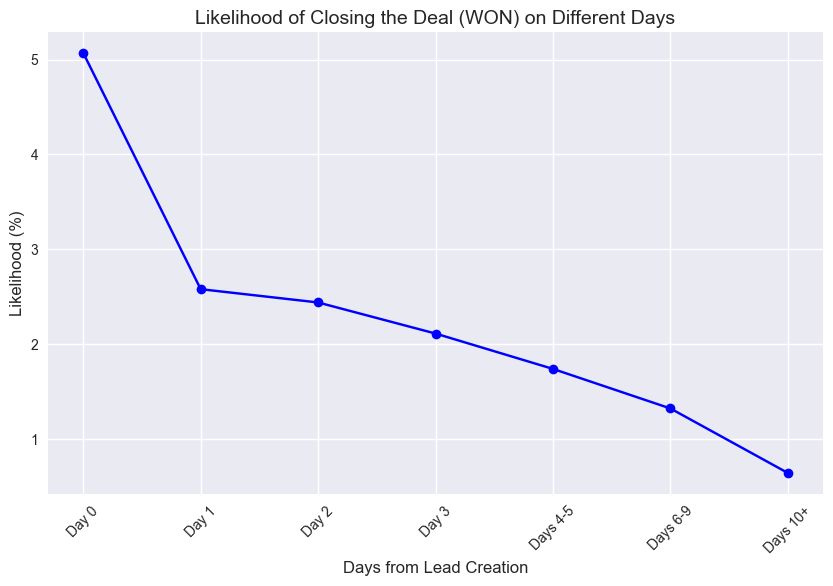

Ratio of WON to LOST deals: 0.02928725369458128


In [73]:
# 1. Grouping by 'CLOSURE_DAY_GROUP' and calculating the percentage of 'WON' deals
grouped = leads_cleaned.groupby('CLOSURE_DAY_GROUP')['DEAL_STATUS'].value_counts(normalize=True).unstack().fillna(0)
# Defining the correct order for the categories
day_order = ['Day 0', 'Day 1', 'Day 2', 'Day 3', 'Days 4-5', 'Days 6-9', 'Days 10+']

# Reindexing the grouped DataFrame to ensure the correct order
grouped = grouped.reindex(day_order)

# Calculating the percentage of 'WON' deals in each group
grouped['WON_percentage'] = grouped['WON'] * 100

# 2. Plotting the likelihood of closing a deal (WON) for each day group
plt.figure(figsize=(10, 6))
plt.plot(grouped.index, grouped['WON_percentage'], marker='o', linestyle='-', color='b')
plt.title('Likelihood of Closing the Deal (WON) on Different Days', fontsize=14)
plt.xlabel('Days from Lead Creation', fontsize=12)
plt.ylabel('Likelihood (%)', fontsize=12)
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

# 3. Calculating the ratio of won to lost deals
won_count = leads_cleaned[leads_cleaned['DEAL_STATUS'] == 'WON'].shape[0]
lost_count = leads_cleaned[leads_cleaned['DEAL_STATUS'] == 'LOST'].shape[0]

ratio_won_lost = won_count / lost_count if lost_count > 0 else 'undefined'
print(f"Ratio of WON to LOST deals: {ratio_won_lost}")


Observation:   

Sales managers' should do their best to close the deal on the same day as it was initiated. In comparison to the company's overall success rate of about 3%, closing on the same day has a 5% success rate. After one day, the chances for a succesful deal get halved. It is still worse pursuing the leads that were initiated 1-3 days ago, where the rate of success is between 2 and 3 percent, but after that the chances of closing succesfully become minimal. So the focus should be on new leads. 

NB - that insight could change with a proper tracking of old lead id's.

#### Sales Manager Performance Overview  

This chart compares each sales manager based on two key performance metrics:

Total number of leads handled (horizontal bars)
Success rate (WON %) (red line)
Sales managers are sorted by the number of leads they’ve worked on, which gives quick insight into:

Who is handling the highest lead volume
Who is converting those leads most effectively
By combining both views, this helps HR and sales management evaluate performance balance across the team — identifying top performers and potential coaching opportunities.

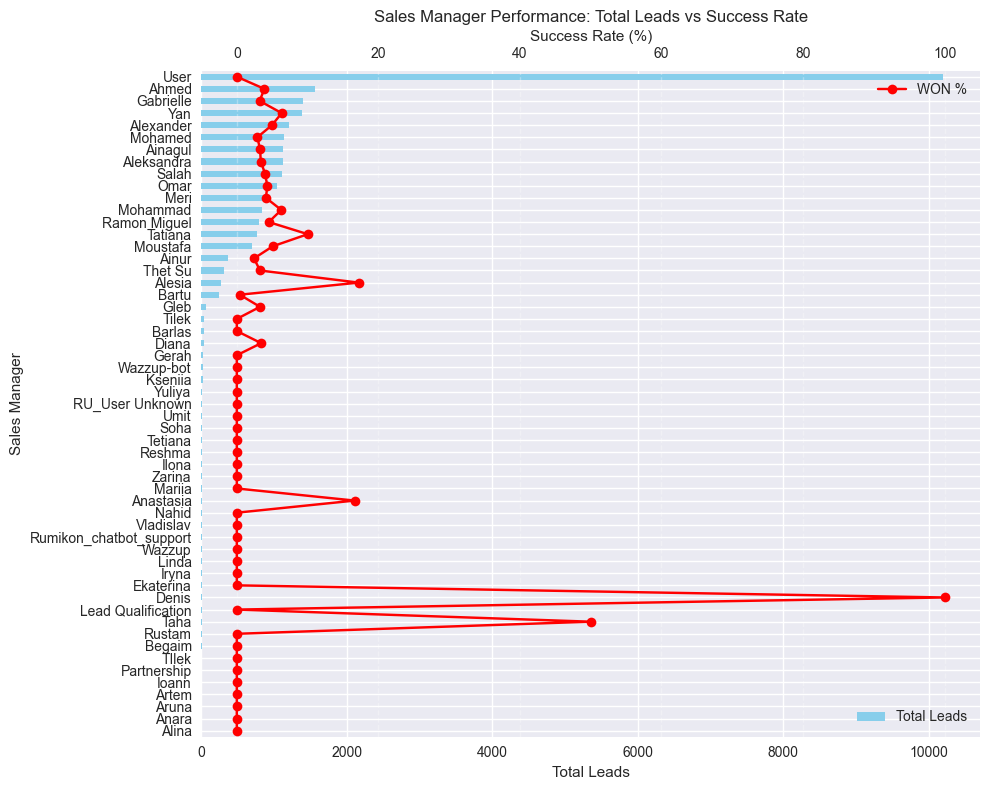

In [74]:
# Filter for leads with definitive outcomes
filtered = leads_cleaned[leads_cleaned['DEAL_STATUS'].isin(['WON', 'LOST'])]

# Group by sales manager and aggregate total and won leads
sales_summary = filtered.groupby('SALES_NAME').agg(
    total_leads=('LEAD_ID', 'count'),
    won_count=('DEAL_STATUS', lambda x: (x == 'WON').sum())
)

# Calculate success rate
sales_summary['won_percentage'] = (sales_summary['won_count'] / sales_summary['total_leads']) * 100

# Sort by total leads for plotting
sales_summary = sales_summary.sort_values(by='total_leads', ascending=True)

# Plot: total leads (bar chart) and success rate (line chart)
fig, ax1 = plt.subplots(figsize=(10, 8))

# Bar: Total leads per sales manager
sales_summary['total_leads'].plot(kind='barh', ax=ax1, color='skyblue', label='Total Leads')
ax1.set_xlabel('Total Leads')
ax1.set_ylabel('Sales Manager')
ax1.set_title('Sales Manager Performance: Total Leads vs Success Rate')

# Secondary axis: success rate (WON %)
ax2 = ax1.twiny()
ax2.plot(sales_summary['won_percentage'], sales_summary.index, 'ro-', label='WON %')
ax2.set_xlabel('Success Rate (%)')

# Legends and visual polish
ax1.legend(loc='lower right')
ax2.legend(loc='upper right')
plt.grid(True, axis='x', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

Refining Sales Manager Performance Analysis  
In this step, we clean and refine our sales performance data to ensure the results are both accurate and actionable:  

Actions Taken:

Removed System/Placeholder Entries

Partnership, RU_User Unknown, Wazzup, Wazzup-bot, Rumikon_chatbot_support, Lead Qualification  

These do not represent individual salespeople and would skew results.  

Excluded Known Outliers

Anastasia, Denis, and Taha  

Their lead volumes or behaviors likely reflect atypical workflows or aggregated team efforts. Their stats are still printed below for reference, but not shown in the visual chart to maintain clarity.



📌 Stats for 'User' (excluded from chart):
            total_leads  won_count  won_percentage
SALES_NAME                                        
User              10196          1        0.009808

📌 Stats for 'Anastasia' (excluded from chart):
            total_leads  won_count  won_percentage
SALES_NAME                                        
Anastasia             6          1       16.666667

📌 Stats for 'Denis' (excluded from chart):
            total_leads  won_count  won_percentage
SALES_NAME                                        
Denis                 2          2           100.0

📌 Stats for 'Taha' (excluded from chart):
            total_leads  won_count  won_percentage
SALES_NAME                                        
Taha                  2          1            50.0


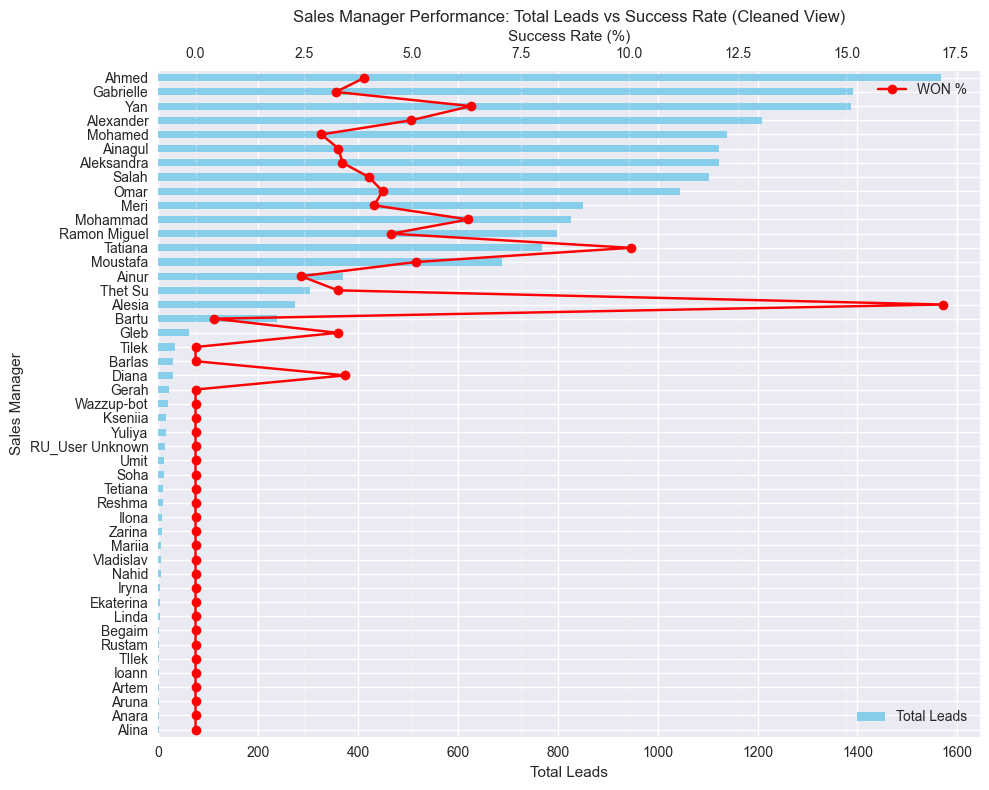

In [75]:
# Filter to leads with valid DEAL_STATUS
filtered = leads_cleaned[leads_cleaned['DEAL_STATUS'].isin(['WON', 'LOST'])].copy()

# Group by sales name and compute totals
sales_summary = filtered.groupby('SALES_NAME').agg(
    total_leads=('LEAD_ID', 'count'),
    won_count=('DEAL_STATUS', lambda x: (x == 'WON').sum())
)
sales_summary['won_percentage'] = (sales_summary['won_count'] / sales_summary['total_leads']) * 100

# System or placeholder names to fully exclude
to_remove = ['Partnership', 'Ru_User Unknown', 'Wazzup', 'Wazzup_bot', 
             'Rumikon_chatbot_support', 'Lead Qualification']
sales_summary = sales_summary.drop(index=to_remove, errors='ignore')

# Identify and print people with 0 leads
zero_leads = sales_summary[sales_summary['total_leads'] == 0]
if not zero_leads.empty:
    print("📌 Sales Managers with 0 Leads (excluded from chart):\n")
    print(zero_leads)

# Outliers to print but not chart
excluded_for_chart = ['User', 'Anastasia', 'Denis', 'Taha']
for name in excluded_for_chart:
    if name in sales_summary.index:
        print(f"\n📌 Stats for '{name}' (excluded from chart):")
        print(sales_summary.loc[[name]])

# Drop these names from the plot data
sales_summary_filtered = sales_summary.drop(index=excluded_for_chart, errors='ignore')

# Also drop zero-lead rows from the plot
sales_summary_filtered = sales_summary_filtered[sales_summary_filtered['total_leads'] > 0]

# Sort for visual clarity
sales_summary_filtered = sales_summary_filtered.sort_values(by='total_leads', ascending=True)

# Plot chart
fig, ax1 = plt.subplots(figsize=(10, 8))

sales_summary_filtered['total_leads'].plot(kind='barh', ax=ax1, color='skyblue', label='Total Leads')
ax1.set_xlabel('Total Leads')
ax1.set_ylabel('Sales Manager')
ax1.set_title('Sales Manager Performance: Total Leads vs Success Rate (Cleaned View)')

# Secondary axis for WON %
ax2 = ax1.twiny()
ax2.plot(sales_summary_filtered['won_percentage'], sales_summary_filtered.index, 'ro-', label='WON %')
ax2.set_xlabel('Success Rate (%)')

# Final polish
ax1.legend(loc='lower right')
ax2.legend(loc='upper right')
plt.grid(True, axis='x', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


📈 Short Analysis of Sales Manager Performance (Chart Above)
The chart reveals key insights into both the volume of leads handled and the effectiveness of individual sales managers:

✅ High Performers by Volume and Success Rate:

Ahmed and Gabrielle stand out by combining relatively high lead volumes with strong conversion rates (WON %) — signaling consistency and reliability.
Yan and Alexander also show solid conversion ratios with sizable volumes, indicating a balanced approach.
⚠️ Low Conversion Across High Volume:

Some managers (e.g., Mohamed, Aleksandra) handle a large number of leads but maintain a low success rate, which may indicate:
Inadequate qualification/follow-up
Process bottlenecks
Overload
📉 Underperformers:

Several salespeople (e.g., Gerah, Wazzup-bot, Ksenia, etc.) have either zero or near-zero success rates despite a moderate number of leads — potential areas for retraining or reassessment.
👥 Team-wide Trend:

Even top performers, with one exception, are below 20% success rate, which suggests:
There may be room to improve lead quality or pre-qualification
Processes could be optimized to support better close rates

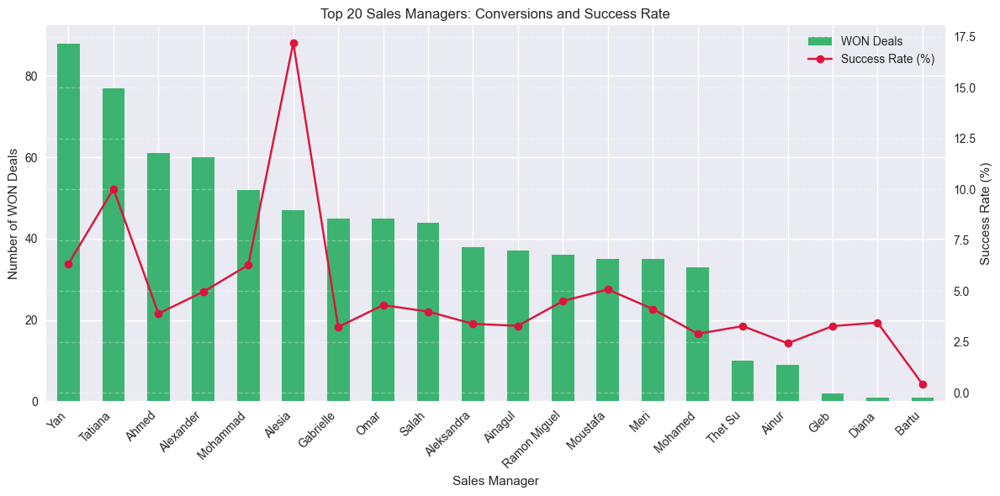

In [76]:
# Filter only WON/LOST deals
filtered = leads_cleaned[leads_cleaned['DEAL_STATUS'].isin(['WON', 'LOST'])].copy()

# Group by sales manager
sales_perf = filtered.groupby('SALES_NAME').agg(
    total_leads=('LEAD_ID', 'count'),
    won_count=('DEAL_STATUS', lambda x: (x == 'WON').sum())
)
sales_perf['won_percentage'] = (sales_perf['won_count'] / sales_perf['total_leads']) * 100

# Remove excluded names (same logic as before)
excluded_names = ['User', 'Anastasia', 'Denis', 'Taha', 
                  'Partnership', 'Ru_User Unknown', 'Wazzup', 
                  'Wazzup_bot', 'Rumikon_chatbot_support', 'Lead Qualification']
sales_perf = sales_perf.drop(index=excluded_names, errors='ignore')

# Remove zero-lead entries
sales_perf = sales_perf[sales_perf['total_leads'] > 0]

# Top 20 by number of conversions
top20_combined = sales_perf.sort_values(by='won_count', ascending=False).head(20)

# Plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Bar plot: absolute number of conversions
top20_combined['won_count'].plot(kind='bar', ax=ax1, color='mediumseagreen', label='WON Deals')
ax1.set_ylabel('Number of WON Deals')
ax1.set_xlabel('Sales Manager')
ax1.set_title('Top 20 Sales Managers: Conversions and Success Rate')
ax1.set_xticklabels(top20_combined.index, rotation=45, ha='right')

# Secondary axis: success rate
ax2 = ax1.twinx()
ax2.plot(top20_combined['won_percentage'].values, color='crimson', marker='o', label='Success Rate (%)')
ax2.set_ylabel('Success Rate (%)')

# Combine legends from both axes
lines_1, labels_1 = ax1.get_legend_handles_labels()
lines_2, labels_2 = ax2.get_legend_handles_labels()
ax1.legend(lines_1 + lines_2, labels_1 + labels_2, loc='upper right')

plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


In [77]:
# Show how many unique sales managers are in each effectiveness group
unique_sales_by_group = leads_cleaned.groupby('PERFORMANCE_GROUP')['SALES_NAME'].nunique()

print("👥 Unique Sales Managers per Performance Group:\n")
print(unique_sales_by_group)


👥 Unique Sales Managers per Performance Group:

PERFORMANCE_GROUP
Low/No Performer    39
Mid Performer        8
Top Performer        8
Name: SALES_NAME, dtype: int64


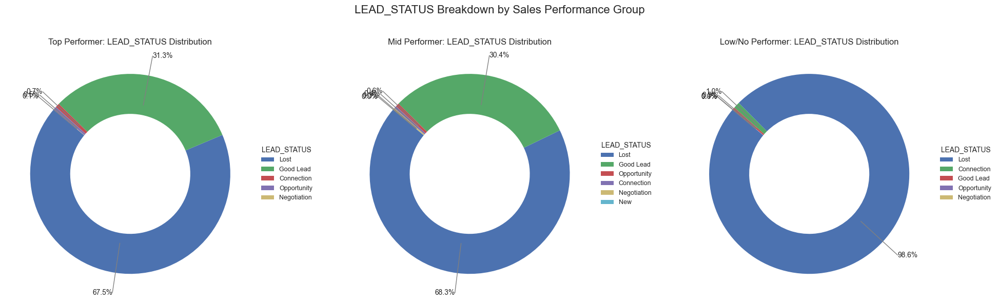

In [78]:
# Define performance groups
performance_groups = ['Top Performer', 'Mid Performer', 'Low/No Performer']

# Set up the figure
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for i, group in enumerate(performance_groups):
    # Filter data
    group_data = leads_cleaned[leads_cleaned['PERFORMANCE_GROUP'] == group]
    lead_status_counts = group_data['LEAD_STATUS'].value_counts()

    labels = lead_status_counts.index
    sizes = lead_status_counts.values
    total = sizes.sum()

    # Create pie (just wedges)
    wedges, _ = axes[i].pie(
        sizes,
        startangle=140,
        wedgeprops=dict(width=0.4),
        labels=None
    )

    # Draw custom leader lines and percentage labels
    for j, wedge in enumerate(wedges):
        angle = (wedge.theta2 + wedge.theta1) / 2
        angle_rad = np.deg2rad(angle)

        # Start and end points for line
        x_start = 0.7 * np.cos(angle_rad)
        y_start = 0.7 * np.sin(angle_rad)
        x_end = 1.2 * np.cos(angle_rad)
        y_end = 1.2 * np.sin(angle_rad)

        # Draw the line
        axes[i].plot([x_start, x_end], [y_start, y_end], color='gray', lw=1)

        # Add % label at end
        percent = f"{(sizes[j] / total) * 100:.1f}%"
        ha = 'left' if x_end > 0 else 'right'
        axes[i].text(x_end, y_end, percent, ha=ha, va='center', fontsize=10)

    # Add legend for labels
    axes[i].legend(
        wedges,
        labels,
        title='LEAD_STATUS',
        bbox_to_anchor=(1, 0.5),
        loc='center left',
        fontsize=9
    )

    axes[i].set_title(f'{group}: LEAD_STATUS Distribution')

# Overall title
plt.suptitle('LEAD_STATUS Breakdown by Sales Performance Group', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


In [79]:
leads_cleaned.columns

Index(['LEAD_STATUS', 'LEAD_SOURCE', 'SALES_NAME', 'DEAL_STATUS', 'LEAD_ID',
       'COMMENTS', 'LOST_REASON', 'GENERATED_FROM', 'USER_COMMENT',
       'NO_REPLY_TEXT', 'PHONE_NUMBER', 'USER_EMAIL', 'EXTRA_COMMENT',
       'VISA_TYPE', 'CREATION_DATE', 'CLOSURE_DATE', 'CREATION_HOUR',
       'CLOSURE_HOUR', 'WEEKDAY', 'MONTH', 'CLOSURE_TIME_DAYS',
       'CLOSURE_DAY_GROUP', 'NO_REPLY_DATE', 'DAYS_FROM_NO_REPLY_TO_CLOSURE',
       'CREATION_WEEK_RANGE', 'CLOSURE_WEEK_RANGE', 'EFFECTIEVENESS_SCORE',
       'PERFORMANCE_GROUP'],
      dtype='object')

Key Insights:

Yan and Tatiana are your high-volume converters, with over 75–90 deals closed — solid performance and decent success rates.  

Alesia is the star in terms of efficiency, standing out with the highest conversion rate despite having fewer total leads.  

Gabrielle closed many deals but with a very low success rate, suggesting she’s handling a very large number of leads — potentially overloaded or dealing with lower-quality leads.  

Bartu and Diana, despite being in the top 20 by closed deals, have near-zero success rates, which could indicate either:  

They're getting flooded with unqualified leads
Or follow-up/sales approach needs review

#### Table comparing data accuracy (% incorrect tags) between best and worst salespeople

In [ ]:
# Step 1: Filter only LOST leads with Work Permit as LOST_REASON
lost_work = leads_cleaned[
    (leads_cleaned['DEAL_STATUS'] == 'LOST') &
    (leads_cleaned['LOST_REASON'] == 'Work Permit')
]

# Step 2: Identify incorrect visa tagging
# (i.e., when the extracted visa type is not 'Work')
misclassified = lost_work[lost_work['VISA_TYPE'].str.lower() != 'work']

# Step 3: Total LOST leads by sales manager
lost_by_manager = leads_cleaned[leads_cleaned['DEAL_STATUS'] == 'LOST'].groupby('SALES_NAME')['LEAD_ID'].count()

# Step 4: Misclassified count by manager
misclassified_by_manager = misclassified.groupby('SALES_NAME')['LEAD_ID'].count()

# Step 5: Build full summary DataFrame
data_quality = pd.DataFrame({
    'lost_total': lost_by_manager,
    'misclassified': misclassified_by_manager
}).fillna(0)

# Calculate percentage of incorrect visa tagging
data_quality['misclassification_rate'] = (data_quality['misclassified'] / data_quality['lost_total']) * 100

# Step 6: Merge with performance (WON count)
won_counts = leads_cleaned[leads_cleaned['DEAL_STATUS'] == 'WON'].groupby('SALES_NAME')['LEAD_ID'].count()
data_quality['won_count'] = won_counts
data_quality = data_quality.fillna(0)

# Step 7: Identify top 20 and bottom 20 performers by WON deals
top_20 = data_quality.sort_values(by='won_count', ascending=False).head(20)
bottom_20 = data_quality.sort_values(by='won_count', ascending=True).head(20)

# Step 8: Print summary comparison
print("🔝 Top 20 Sales Managers - Incorrect Visa Tagging (%):")
print(top_20[['won_count', 'misclassified', 'lost_total', 'misclassification_rate']].round(2))

print("\n🔻 Bottom 20 Sales Managers - Incorrect Visa Tagging (%):")
print(bottom_20[['won_count', 'misclassified', 'lost_total', 'misclassification_rate']].round(2))


🔝 Top 20 Sales Managers - Incorrect Visa Tagging (%):
              won_count  misclassified  lost_total  misclassification_rate
SALES_NAME                                                                
Yan                88.0           86.0        1299                    6.62
Tatiana            77.0            0.0         691                    0.00
Ahmed              61.0          111.0        1506                    7.37
Alexander          60.0           93.0        1148                    8.10
Mohammad           52.0           51.0         775                    6.58
Alesia             47.0           13.0         226                    5.75
Omar               45.0           72.0         999                    7.21
Gabrielle          45.0          144.0        1347                   10.69
Salah              44.0           50.0        1058                    4.73
Aleksandra         38.0           80.0        1084                    7.38
Ainagul            37.0           64.0        

In [ ]:
# Define bot/system names
bot_names = [
    'User', 'RU_User Unknown', 'Wazzup', 'Wazzup-bot', 
    'Rumikon_chatbot_support', 'Lead Qualification', 'Partnership'
]

# Step 1: Get all unique sales names excluding bots
all_salespeople = leads_cleaned['SALES_NAME'].dropna().unique()
human_salespeople = [name for name in all_salespeople if name not in bot_names]

# Step 2: Get salespeople with at least one WON deal
won_sales = leads_cleaned[leads_cleaned['DEAL_STATUS'] == 'WON']
won_counts = won_sales.groupby('SALES_NAME')['LEAD_ID'].count()
won_salespeople = [name for name in won_counts.index if name not in bot_names]

# Step 3: Print counts
print(f"🧍 Total human salespeople in Volta (excluding bots): {len(human_salespeople)}")
print(f"🏆 Salespeople with at least one WON deal: {len(won_salespeople)}")


🧍 Total human salespeople in Volta (excluding bots): 48
🏆 Salespeople with at least one WON deal: 23


In [ ]:
data_quality_sorted.head(20)

,lost_total,misclassified,misclassification_rate,won_count
SALES_NAME,,,,
Yan,1299,86.0,6.620477,88.0
Tatiana,691,0.0,0.000000,77.0
Ahmed,1506,111.0,7.370518,61.0
Alexander,1148,93.0,8.101045,60.0
Mohammad,775,51.0,6.580645,52.0
Alesia,226,13.0,5.752212,47.0
Omar,999,72.0,7.207207,45.0
Gabrielle,1347,144.0,10.690423,45.0
Salah,1058,50.0,4.725898,44.0


Even among the top-performing salespeople (like Yan, Ahmed, Alexander, and Gabrielle), there’s a non-negligible misclassification rate where the lost reason is recorded as "Work Permit", but the extracted visa type is something else.  


📉 Key Points:  


✅ Success does not seem to correlate with correct tagging — high performers also make these mistakes.  

❗ Some names (like Ainur, with 51.8% misclassification) show chronic misuse of "Work Permit" as a generic or fallback lost reason.  

⚠️ This creates a misleading view of customer intent and may:  

Distort internal reporting and funnel diagnostics
Lead to incorrect assumptions about market demand
Misguide future marketing, sales, or HR decisions

In [ ]:
leads_cleaned.columns

Index(['LEAD_STATUS', 'LEAD_SOURCE', 'SALES_NAME', 'DEAL_STATUS', 'LEAD_ID',
       'COMMENTS', 'LOST_REASON', 'GENERATED_FROM', 'USER_COMMENT',
       'NO_REPLY_TEXT', 'PHONE_NUMBER', 'USER_EMAIL', 'EXTRA_COMMENT',
       'VISA_TYPE', 'CREATION_DATE', 'CLOSURE_DATE', 'CREATION_HOUR',
       'CLOSURE_HOUR', 'WEEKDAY', 'MONTH', 'CLOSURE_TIME_DAYS',
       'CLOSURE_DAY_GROUP', 'NO_REPLY_DATE', 'DAYS_FROM_NO_REPLY_TO_CLOSURE',
       'CREATION_WEEK_RANGE', 'CLOSURE_WEEK_RANGE', 'effectiveness_score',
       'PERFORMANCE_GROUP'],
      dtype='object')

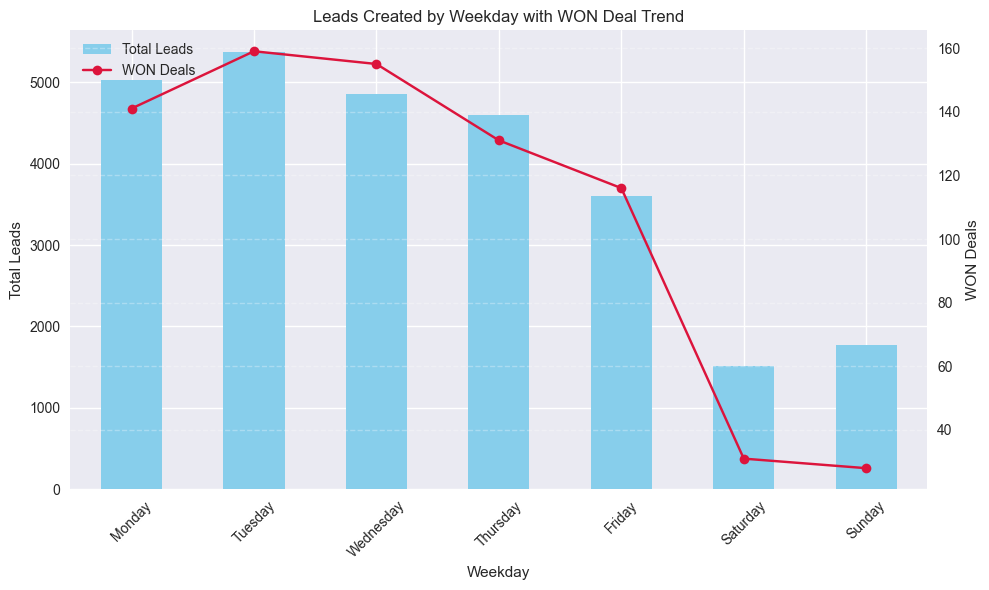

In [ ]:


# Count total leads per weekday
leads_by_weekday = leads_cleaned.groupby('WEEKDAY')['LEAD_ID'].count()

# Count WON deals per weekday
won_by_weekday = leads_cleaned[leads_cleaned['DEAL_STATUS'] == 'WON'].groupby('WEEKDAY')['LEAD_ID'].count()

# Combine both counts
combined_weekday = pd.DataFrame({
    'total_leads': leads_by_weekday,
    'won_deals': won_by_weekday
}).fillna(0)

# Reorder weekdays manually
weekday_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
combined_weekday = combined_weekday.reindex(weekday_order)

# Plot
fig, ax1 = plt.subplots(figsize=(10, 6))
combined_weekday['total_leads'].plot(kind='bar', ax=ax1, color='skyblue', label='Total Leads')
ax1.set_ylabel('Total Leads')
ax1.set_xlabel('Weekday')
ax1.set_title('Leads Created by Weekday with WON Deal Trend')
ax1.set_xticklabels(combined_weekday.index, rotation=45)

# Secondary axis for WON deals
ax2 = ax1.twinx()
ax2.plot(combined_weekday['won_deals'].values, color='crimson', marker='o', label='WON Deals')
ax2.set_ylabel('WON Deals')

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

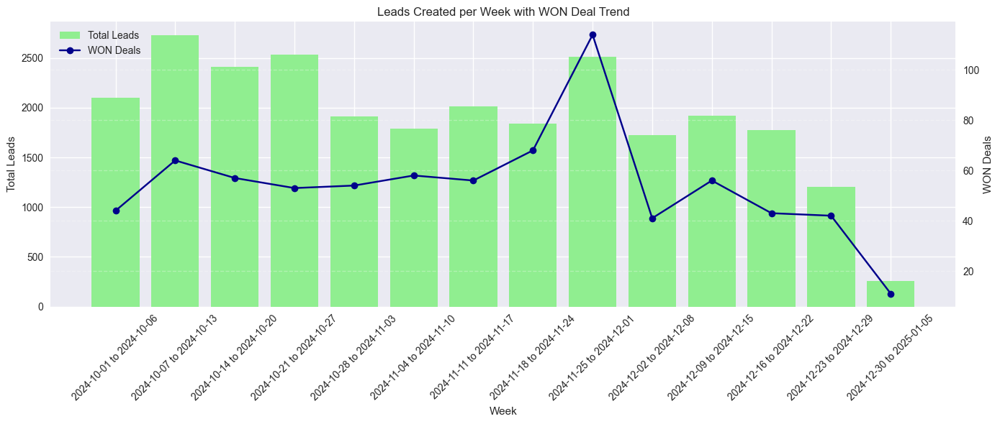

In [ ]:
# Step 1: Group by the precomputed CREATION_WEEK_RANGE
leads_by_week = leads_cleaned.groupby('CREATION_WEEK_RANGE')['LEAD_ID'].count()
won_by_week = leads_cleaned[leads_cleaned['DEAL_STATUS'] == 'WON'].groupby('CREATION_WEEK_RANGE')['LEAD_ID'].count()

# Step 2: Combine totals into one DataFrame
weekly_summary = pd.DataFrame({
    'total_leads': leads_by_week,
    'won_deals': won_by_week
}).fillna(0)

# Step 3: Sort by actual week start date
# Use the first date in each week range as datetime index
weekly_summary['week_start'] = pd.to_datetime([label.split(" to ")[0] for label in weekly_summary.index])
weekly_summary = weekly_summary.sort_values(by='week_start')

# Step 4: Plot
fig, ax1 = plt.subplots(figsize=(14, 6))

# Bar chart: total leads
ax1.bar(weekly_summary.index, weekly_summary['total_leads'], color='lightgreen', label='Total Leads')
ax1.set_ylabel('Total Leads')
ax1.set_xlabel('Week')
ax1.set_title('Leads Created per Week with WON Deal Trend')
ax1.tick_params(axis='x', rotation=45)
ax1.set_xticks(weekly_summary.index)
ax1.set_xticklabels(weekly_summary.index, rotation=45)

# Line chart: WON deals
ax2 = ax1.twinx()
ax2.plot(weekly_summary.index, weekly_summary['won_deals'], color='darkblue', marker='o', label='WON Deals')
ax2.set_ylabel('WON Deals')

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


📌 Nov 25–Dec 1 should be analyzed in more detail — what channels, visa types, or manager behaviors drove the spike?
📉 December dip may be seasonal, but it’s worth checking whether follow-up processes or staffing could be adjusted to prevent drop-offs.
🔁 Consider using this weekly aggregation as a standard view for internal reporting — less noisy, and great for tracking campaign impact and operational cadence.

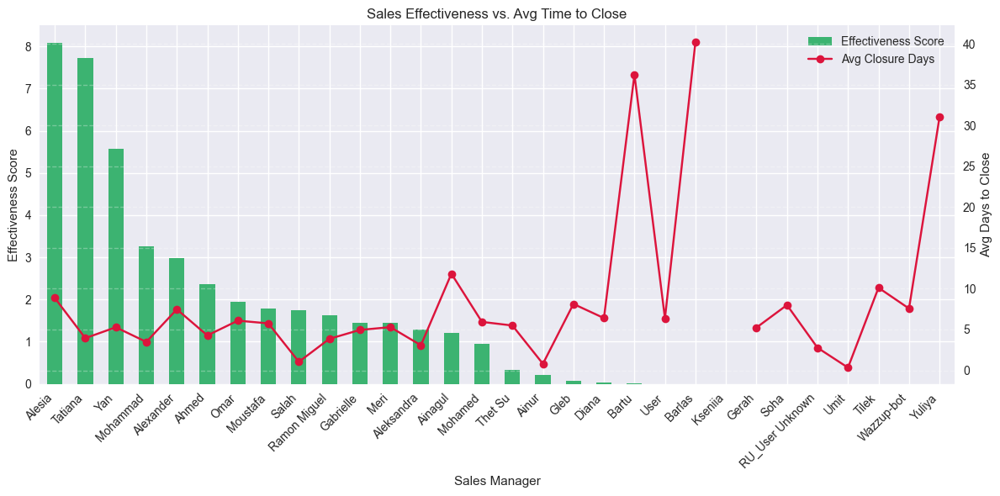

In [ ]:
# Step 1: Reuse effectiveness scores (min 10 leads already applied earlier)
# Step 2: Calculate avg closure time per sales manager (WON + LOST)
avg_closure = leads_cleaned[
    leads_cleaned['DEAL_STATUS'].isin(['WON', 'LOST'])
].groupby('SALES_NAME')['CLOSURE_TIME_DAYS'].mean()

# Step 3: Merge with effectiveness
effectiveness_with_time = effectiveness.merge(avg_closure, left_index=True, right_index=True)
effectiveness_with_time = effectiveness_with_time.rename(columns={'CLOSURE_TIME_DAYS': 'avg_closure_days'})

# Step 4: Sort by effectiveness
effectiveness_with_time = effectiveness_with_time.sort_values(by='effectiveness_score', ascending=False)

# Step 5: Plot bar + line chart
fig, ax1 = plt.subplots(figsize=(12, 6))

# Bar: Effectiveness score
effectiveness_with_time['effectiveness_score'].plot(kind='bar', ax=ax1, color='mediumseagreen', label='Effectiveness Score')
ax1.set_ylabel('Effectiveness Score')
ax1.set_xlabel('Sales Manager')
ax1.set_title('Sales Effectiveness vs. Avg Time to Close')
ax1.set_xticklabels(effectiveness_with_time.index, rotation=45, ha='right')

# Line: Average closure days
ax2 = ax1.twinx()
ax2.plot(effectiveness_with_time['avg_closure_days'].values, color='crimson', marker='o', label='Avg Closure Days')
ax2.set_ylabel('Avg Days to Close')

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


/var/folders/67/x74mgr8122l6kp90mlcp_vv80000gn/T/ipykernel_2621/1488372679.py:20: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(effectiveness_with_gap.index, rotation=45, ha='right')


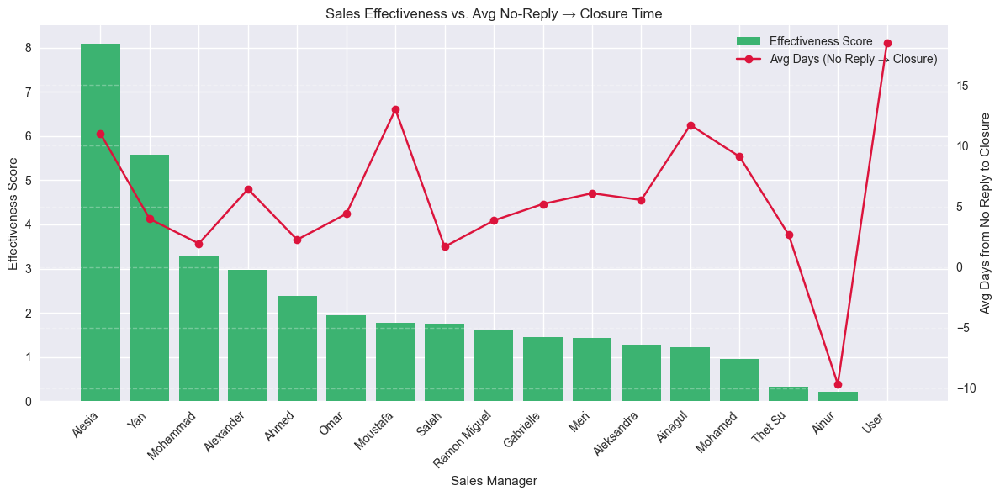

📉 Correlation (Effectiveness vs. No-Reply → Closure): r = 0.10


In [ ]:
# Step 1: Compute avg days from no-reply to closure (only for rows where it's available)
avg_no_reply_gap = leads_cleaned.dropna(subset=['DAYS_FROM_NO_REPLY_TO_CLOSURE'])
avg_no_reply_gap = avg_no_reply_gap.groupby('SALES_NAME')['DAYS_FROM_NO_REPLY_TO_CLOSURE'].mean()
avg_no_reply_gap.name = 'avg_no_reply_to_closure'

# Step 2: Merge with existing effectiveness DataFrame
effectiveness_with_gap = effectiveness.merge(avg_no_reply_gap, left_index=True, right_index=True)

# Step 3: Sort by effectiveness
effectiveness_with_gap = effectiveness_with_gap.sort_values(by='effectiveness_score', ascending=False)

# Step 4: Plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Bar: Effectiveness score
ax1.bar(effectiveness_with_gap.index, effectiveness_with_gap['effectiveness_score'], color='mediumseagreen', label='Effectiveness Score')
ax1.set_ylabel('Effectiveness Score')
ax1.set_xlabel('Sales Manager')
ax1.set_title('Sales Effectiveness vs. Avg No-Reply → Closure Time')
ax1.set_xticklabels(effectiveness_with_gap.index, rotation=45, ha='right')

# Line: Avg days from no-reply to closure
ax2 = ax1.twinx()
ax2.plot(effectiveness_with_gap['avg_no_reply_to_closure'].values, color='crimson', marker='o', label='Avg Days (No Reply → Closure)')
ax2.set_ylabel('Avg Days from No Reply to Closure')

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Optional: print correlation
corr = effectiveness_with_gap['effectiveness_score'].corr(effectiveness_with_gap['avg_no_reply_to_closure'])
print(f"📉 Correlation (Effectiveness vs. No-Reply → Closure): r = {corr:.2f}")


/var/folders/67/x74mgr8122l6kp90mlcp_vv80000gn/T/ipykernel_2621/3816886605.py:24: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax1.set_xticklabels(effectiveness_with_reply_rate.index, rotation=45, ha='right')


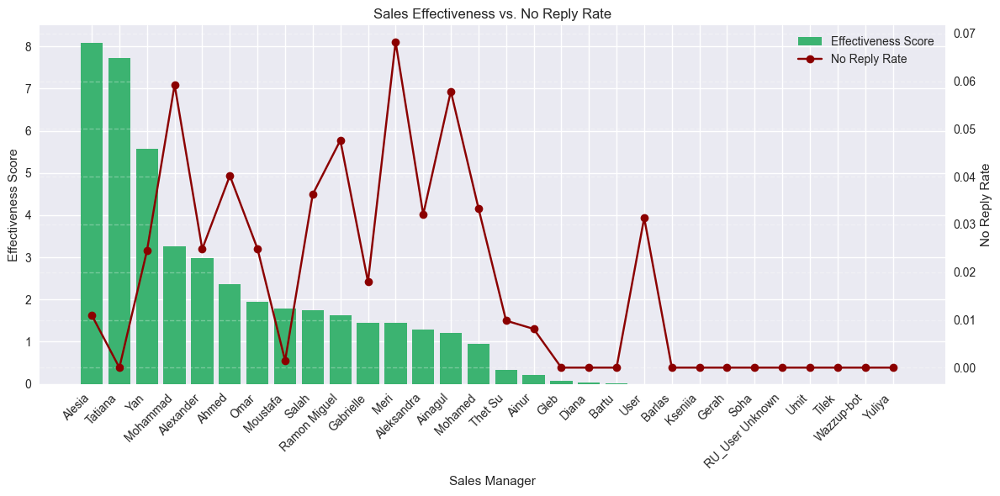

📉 Correlation (Effectiveness vs. No Reply Rate): r = 0.21


In [ ]:
# Step 1: Count total leads and no reply leads per salesperson
total_leads_all = leads_cleaned.groupby('SALES_NAME')['LEAD_ID'].count()
no_reply_count = leads_cleaned.dropna(subset=['NO_REPLY_DATE']).groupby('SALES_NAME')['LEAD_ID'].count()

# Step 2: Calculate no reply rate
no_reply_rate = (no_reply_count / total_leads_all).fillna(0)
no_reply_rate.name = 'no_reply_rate'

# Step 3: Merge with effectiveness scores
effectiveness_with_reply_rate = effectiveness.merge(no_reply_rate, left_index=True, right_index=True)

# Step 4: Sort
effectiveness_with_reply_rate = effectiveness_with_reply_rate.sort_values(by='effectiveness_score', ascending=False)

# Step 5: Plot
fig, ax1 = plt.subplots(figsize=(12, 6))

# Bar chart: Effectiveness
ax1.bar(effectiveness_with_reply_rate.index, effectiveness_with_reply_rate['effectiveness_score'],
        color='mediumseagreen', label='Effectiveness Score')
ax1.set_ylabel('Effectiveness Score')
ax1.set_xlabel('Sales Manager')
ax1.set_title('Sales Effectiveness vs. No Reply Rate')
ax1.set_xticklabels(effectiveness_with_reply_rate.index, rotation=45, ha='right')

# Line chart: No reply rate
ax2 = ax1.twinx()
ax2.plot(effectiveness_with_reply_rate['no_reply_rate'].values, color='darkred', marker='o', label='No Reply Rate')
ax2.set_ylabel('No Reply Rate')

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper right')

plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Step 6: Print correlation
corr = effectiveness_with_reply_rate['effectiveness_score'].corr(effectiveness_with_reply_rate['no_reply_rate'])
print(f"📉 Correlation (Effectiveness vs. No Reply Rate): r = {corr:.2f}")


 Key Insights:
Top performers have low no-reply rates

Alesia, Tatiana, and Yan (highest effectiveness scores) all have very low no-reply rates
Suggests strong, timely, and consistent engagement with leads
Possibly better lead qualification up front or more responsive communication  

⚠️ Some mid-performers have high no-reply rates

Mohammad, Ahmed, and Salah, and Ramon Miguel show spikes in no-reply rate, even though they’re in the top/mid effectiveness range
This may point to inconsistent follow-up or overreliance on volume
They might benefit from automation or structured reminders for drop-off leads  

Most low-performers have near-zero no-reply rate

Suggests their issue is not follow-up, but possibly:
Poor qualification
Low-quality leads assigned
Lack of closing skills


🧊 Zero-performance managers have 0% no-reply rates

Bot accounts and inactive users all sit at zero effectiveness with zero no-replies.
Likely they are:
Not active on leads at all
Internal, bot, or test users
Should be filtered in operational views


In [81]:
leads_cleaned.columns


Index(['LEAD_STATUS', 'LEAD_SOURCE', 'SALES_NAME', 'DEAL_STATUS', 'LEAD_ID',
       'COMMENTS', 'LOST_REASON', 'GENERATED_FROM', 'USER_COMMENT',
       'NO_REPLY_TEXT', 'PHONE_NUMBER', 'USER_EMAIL', 'EXTRA_COMMENT',
       'VISA_TYPE', 'CREATION_DATE', 'CLOSURE_DATE', 'CREATION_HOUR',
       'CLOSURE_HOUR', 'WEEKDAY', 'MONTH', 'CLOSURE_TIME_DAYS',
       'CLOSURE_DAY_GROUP', 'NO_REPLY_DATE', 'DAYS_FROM_NO_REPLY_TO_CLOSURE',
       'CREATION_WEEK_RANGE', 'CLOSURE_WEEK_RANGE', 'EFFECTIEVENESS_SCORE',
       'PERFORMANCE_GROUP'],
      dtype='object')

### Analysis for the marketing team

Analyzing which lead sources generate the highest volume of leads and the best conversion rates. This helps marketing teams identify the most valuable acquisition channels.

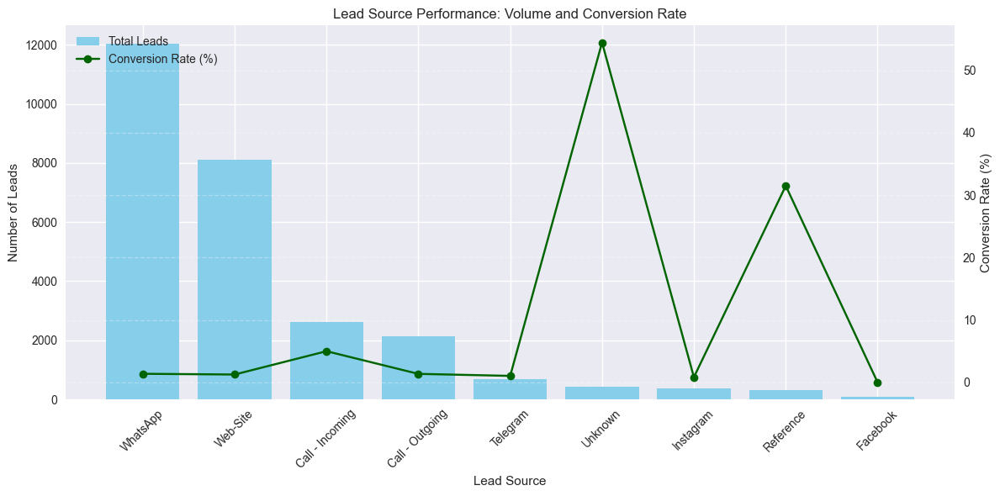

In [ ]:
# Filtering only WON and LOST deals
valid_leads = leads_cleaned[leads_cleaned['DEAL_STATUS'].isin(['WON', 'LOST'])]

# Calculating total and won leads per source
lead_counts = valid_leads.groupby('LEAD_SOURCE')['LEAD_ID'].count()
won_counts = valid_leads[valid_leads['DEAL_STATUS'] == 'WON'].groupby('LEAD_SOURCE')['LEAD_ID'].count()

# Calculating conversion rate
conversion_rate = (won_counts / lead_counts * 100).fillna(0)

# Creating a combined summary table
source_summary = pd.DataFrame({
    'total_leads': lead_counts,
    'won_deals': won_counts,
    'conversion_rate': conversion_rate
}).fillna(0).sort_values(by='total_leads', ascending=False)

# Plotting total leads and conversion rate by source
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plotting total leads as bars
ax1.bar(source_summary.index, source_summary['total_leads'], color='skyblue', label='Total Leads')
ax1.set_ylabel('Number of Leads')
ax1.set_xlabel('Lead Source')
ax1.tick_params(axis='x', rotation=45)
ax1.set_title('Lead Source Performance: Volume and Conversion Rate')

# Plotting conversion rate as line
ax2 = ax1.twinx()
ax2.plot(source_summary.index, source_summary['conversion_rate'], color='darkgreen', marker='o', label='Conversion Rate (%)')
ax2.set_ylabel('Conversion Rate (%)')

# Combining legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

# Enhancing layout
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


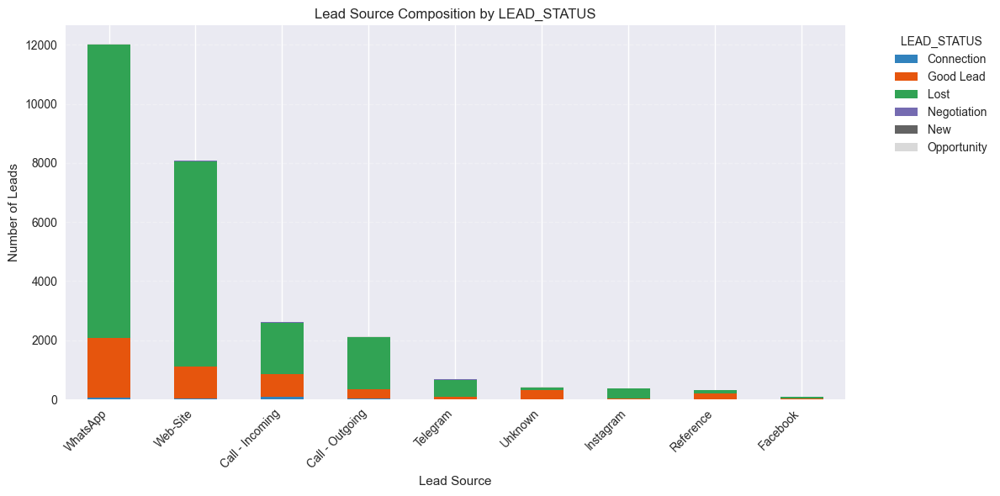

In [ ]:
# Creating a pivot table: rows = LEAD_SOURCE, columns = LEAD_STATUS
lead_status_by_source = leads_cleaned.pivot_table(
    index='LEAD_SOURCE',
    columns='LEAD_STATUS',
    values='LEAD_ID',
    aggfunc='count',
    fill_value=0
)

# Sorting by total number of leads per source
lead_status_by_source = lead_status_by_source.loc[
    lead_status_by_source.sum(axis=1).sort_values(ascending=False).index
]

# Plotting stacked bar chart
lead_status_by_source.plot(
    kind='bar',
    stacked=True,
    figsize=(12, 6),
    colormap='tab20c'
)

plt.title('Lead Source Composition by LEAD_STATUS')
plt.xlabel('Lead Source')
plt.ylabel('Number of Leads')
plt.xticks(rotation=45, ha='right')
plt.legend(title='LEAD_STATUS', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.show()


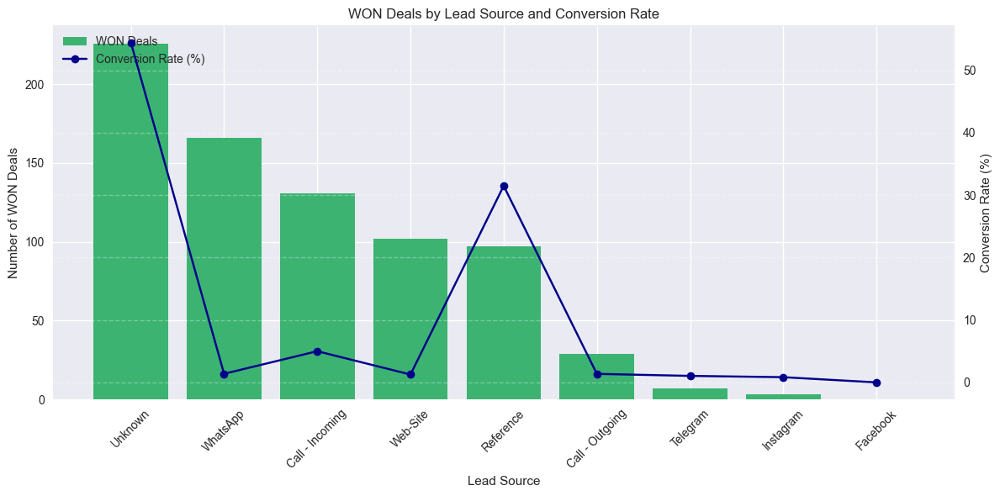

In [ ]:
# Filtering only WON and LOST deals
valid_leads = leads_cleaned[leads_cleaned['DEAL_STATUS'].isin(['WON', 'LOST'])]

# Counting total leads per source
total_by_source = valid_leads['LEAD_SOURCE'].value_counts()
won_by_source = valid_leads[valid_leads['DEAL_STATUS'] == 'WON']['LEAD_SOURCE'].value_counts()

# Aligning and filling missing sources with zero
all_sources = total_by_source.index.union(won_by_source.index)
total_by_source = total_by_source.reindex(all_sources, fill_value=0)
won_by_source = won_by_source.reindex(all_sources, fill_value=0)

# Calculating conversion rate per source
conversion_rate = (won_by_source / total_by_source * 100).fillna(0)

# Sorting by absolute won deals
sorted_sources = won_by_source.sort_values(ascending=False).index
won_by_source = won_by_source.loc[sorted_sources]
conversion_rate = conversion_rate.loc[sorted_sources]

# Plotting bar + line chart
fig, ax1 = plt.subplots(figsize=(12, 6))

# Bar: number of WON deals
ax1.bar(won_by_source.index, won_by_source.values, color='mediumseagreen', label='WON Deals')
ax1.set_ylabel('Number of WON Deals')
ax1.set_xlabel('Lead Source')
ax1.set_title('WON Deals by Lead Source and Conversion Rate')
ax1.tick_params(axis='x', rotation=45)

# Line: conversion rate
ax2 = ax1.twinx()
ax2.plot(won_by_source.index, conversion_rate.values, color='darkblue', marker='o', label='Conversion Rate (%)')
ax2.set_ylabel('Conversion Rate (%)')

# Combine legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left')

# Grid and layout
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()


In [ ]:
 leads_cleaned['GENERATED_FROM'].value_counts()

GENERATED_FROM
Home                                                                                        6938
Urgent Schengen Visa                                                                         290
Urgent Us Visa                                                                                50
Page ""                                                                                       44
Visa To Italy                                                                                 31
Visa To Spain                                                                                 26
Срочный Шенген                                                                                26
Urgent Uk Visa                                                                                22
Visa To Hungary                                                                               20
Срочная Виза В Сша                                                                            20
Visa To France 

In [82]:
# Apply mask for WON deals
mask_won = leads_cleaned['DEAL_STATUS'] == 'WON'
won_deals = leads_cleaned[mask_won]

# Count WON deals by LEAD_SOURCE
won_by_source = won_deals['GENERATED_FROM'].value_counts()

In [83]:
won_by_source

GENERATED_FROM
Home                                                            71
Urgent Us Visa                                                   6
Urgent Schengen Visa                                             3
Срочный Шенген                                                   2
Срочная Виза В Сша                                               2
Visa To Spain                                                    1
Visa To Finland                                                  1
Visa To Cyprus                                                   1
Виза В Uk                                                        1
Us Visa Renewal: Guidelines And Procedures For Uae Residents     1
Visa To Greece                                                   1
Visa To Italy                                                    1
Uk Student Visa                                                  1
Name: count, dtype: int64

In [ ]:
# Mask for WON and LOST deals
mask_won = leads_cleaned['DEAL_STATUS'] == 'WON'
mask_lost = leads_cleaned['DEAL_STATUS'] == 'LOST'

# For WON
won_total = mask_won.sum()
won_with_generated_from = leads_cleaned.loc[mask_won, 'GENERATED_FROM'].notna().sum()
won_percentage = (won_with_generated_from / won_total) * 100

# For LOST
lost_total = mask_lost.sum()
lost_with_generated_from = leads_cleaned.loc[mask_lost, 'GENERATED_FROM'].notna().sum()
lost_percentage = (lost_with_generated_from / lost_total) * 100

# Print results
print(f"WON deals with GENERATED_FROM filled: {won_with_generated_from} / {won_total} ({won_percentage:.1f}%)")
print(f"LOST deals with GENERATED_FROM filled: {lost_with_generated_from} / {lost_total} ({lost_percentage:.1f}%)")


WON deals with GENERATED_FROM filled: 92 / 761 (12.1%)
LOST deals with GENERATED_FROM filled: 7653 / 25984 (29.5%)
